## Les modules

In [9]:
%load_ext autoreload
%autoreload 1
import nbimporter
import time
from tqdm import tqdm
import numpy as np
from sklearn.datasets import make_blobs,make_circles
from sklearn.metrics import accuracy_score
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation as animation
#from mpl_toolkits.mplot3d import Axes3D
import tensorflow_datasets as tfds
import matplotlib as mpl

from IPython.display import HTML
from IPython.display import clear_output
from IPython.display import clear_output, display
import os


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Mise à jours

In [2]:
import sys
import importlib
module_nom= ['AtadiaSah','exemple_fonction_indicatrice','Dataset','sah']
for i in module_nom:
    if i in sys.modules:
        del sys.modules[i]
import AtadiaSah as As
importlib.reload(As)
import exemple_fonction_indicatrice as FI
importlib.reload(FI)
import Dataset
importlib.reload(Dataset)
import sah
importlib.reload(sah)

<module 'sah' from 'sah.ipynb'>

## DATASET DES CHATS ET CHIENS

In [3]:
X_train1, y_train1, X_test1, y_test1=Dataset.chats_chiens()

X_train=As.normalisation('min_max',X_train1).T
X_test=As.normalisation('min_max',X_test1).T

y_train=y_train1.T
y_test=y_test1.T

taille_train=900
taille_test=200

X=X_train.reshape(-1,X_train.shape[-1])[:,:taille_train]
X_test=X_test.reshape(-1,X_test.shape[-1])[:,:taille_test]
X_fiture=X_train.reshape(-1,X_train.shape[-1])[:,taille_train:]

y_x=y_train[:,:taille_train]
y_test=y_test[:,:taille_test]
X_train1.shape,X_test1.shape

((1000, 64, 64), (200, 64, 64))

## 10 IMAGE DU DATASET

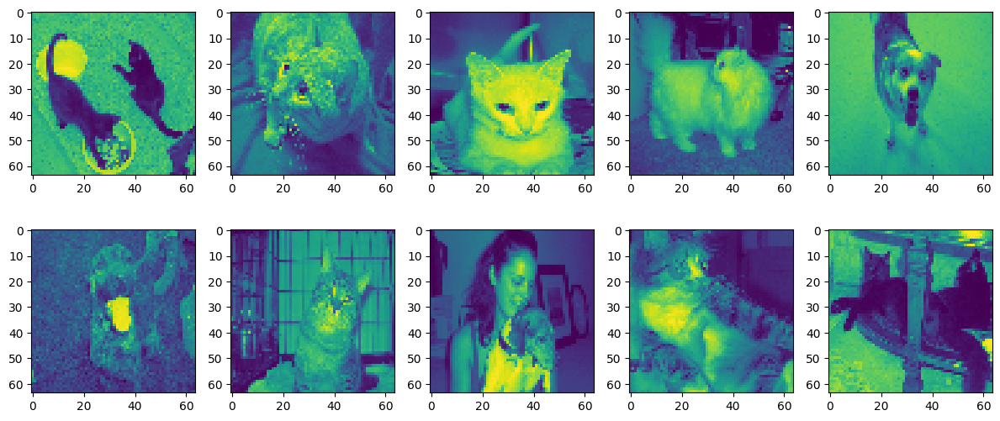

In [5]:
Dataset.visualisation(X_train1,10)

## Réseau

In [112]:
modele=sah.RN()

c1=As.coucheDense(As.fonction_activation('ELU',0.1),1,100)
c2=As.coucheDense(As.fonction_activation('relu',0.1),1,100)
c3=As.coucheDense(As.fonction_activation('Leaky_relu',0.01),1,10)
c4=As.coucheDense(As.fonction_activation('sigmoide'),1,1)

modele.add_couche(As.réseau(c1,c2,c3,c4))
modele.add_loss('ECB')
modele.add_regularisation('elasticnet',0,0)
modele.add_optimiseur('mini_batch','PD_exp',0.001,1e-9,100)                                     #'DGC','PD_exp',0.01,32#SGD
modele.add_score('Accuracy_score')           #Accuracy_score_multiclasse


In [113]:
paramètres,cout1,cout2,score1,score2,temps_ecouler=modele.fil(modele,100,1,X,y_x,X_test,y_test)

L'architecture du réseau:[4096, 100, 100, 10, 1]


Apprentissage:loss_trainset:0.627579949,score_trainset:0.686: 100%|█████████████████████████████| 101/101 [01:14<00:00,  1.35it/s]

le socre du modèle est de :0.69


In [125]:
for i in range(2):
    modele.add_optimiseur('mini_batch','PD_exp',0.001/4*i,1e-9,50) 
    modele.continue_fil(modele,100,1)

Apprentissage:loss_trainset:0.008373075,score_trainset:1.000: 100%|█████████████████████████████| 100/100 [01:53<00:00,  1.14s/it]


le socre du modèle est de :1.00


Apprentissage:loss_trainset:0.006957742,score_trainset:1.000: 100%|█████████████████████████████| 100/100 [01:51<00:00,  1.11s/it]

le socre du modèle est de :1.00


In [116]:
#modele.continue_fil_condition(modele,10,100,1e-9,1)

In [10]:
mpl.rcParams['animation.embed_limit'] =50000 

In [126]:
nom='classification_chats_chiens'
a0=('classificationMultiClasse','chats_chiens')
a=(X_train1,X_fiture)
taille=('non','non')
ani,figure=modele.evo(modele,a0,a,taille,1e-3,10) 
figure.savefig(f'C:/Users/GEMSI\Desktop/Mes images ANN mémoire/{nom}.png')

 99%|███████████████████████████████████████████████████████████████████████████████▍| 150/151 [04:40<00:01,  1.85s/it]

In [127]:
HTML(ani.to_jshtml())

In [128]:
ani.save(f'C:/Users/GEMSI/Desktop/Mes animation mémoire M2/animation{nom}.mp4', writer='ffmpeg', fps=60)

 99%|███████████████████████████████████████████████████████████████████████████████▎| 110/111 [29:48<00:16, 16.26s/it]


## visualiser les fonctions loss,score particulier¶

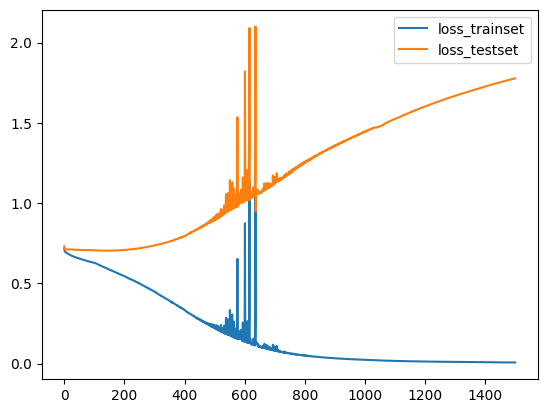

In [129]:
loss_trainset,score_trainset,temps,loss_testset,score_testset=modele.loss_score(modele)
plt.plot(loss_trainset,label='loss_trainset')
plt.plot(loss_testset,label='loss_testset')
plt.legend()

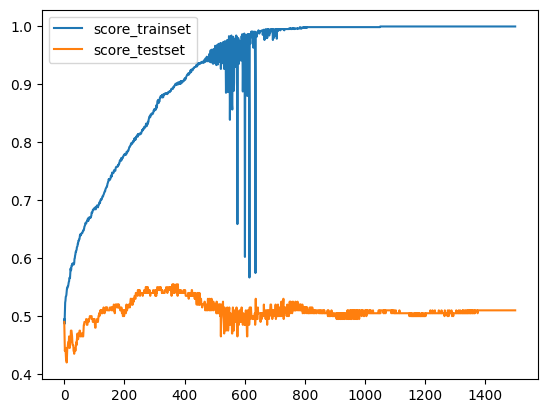

In [130]:
plt.plot(score_trainset,label='score_trainset')
plt.plot(score_testset,label='score_testset')
plt.legend()

In [131]:
#plt.plot(modele.modele_save[0]['loss_trainset'],label='loss_trainset')
#plt.plot(modele.modele_save[-1]['score_trainset'],label='score_trainset')
#plt.plot(modele.modele_save[-1]['score_testset'],label='score_testset')

In [132]:
a=modele